<center><h1> Exploring Madrid's housing market </h1></center>
<center><h2>           created by Juan Ramón Selva and Gladys Kenyon for the SDSC 2022                          </h2></center>

<center><h2> https://github.com/gladyskenyon/SDSC_22_workshop   </h2></center>

<center><h3> Introduction </h3></center>

The following workbook takes you through a spatial analysis of the housing market in Madrid. The data is provided by Idealista, a major property advertisement company which operates in Southern Europe. The data is openly available in the package idealista18 (https://github.com/paezha/idealista18). Each Sale file contains quarterly single family listings for Madrid, Barcelona and Valencia during 2018. Some of the variables are sourced from the Cadastral (official building register in Spain). Other data includes the neighourhood polygons and building footprints
. All spatial features, polygons and points, are expressed in coordinates using the EPSG:4326 coordinate reference system. The data will be processed by quantitative analysis to explore spatial residential urban patterns and market segments. 

<center><h4> 'A picture is worth a thousand words' </h4></center>

Often, complex ideas and relationships can be conveyed quickly and more effectively using a single image than by written word. Data Visualisation is an integral element of data science and analysis, allowing insights through graphical presentations of the data. With spatial data, these techniques become even more powerful and insightful. 

### Section 1: Exploratory (Spatial) Data Analysis
* Section 1A: Visualisations
* Section 1B: Geovisualisations  

### Section 2: Unsupervised Machine learning  
* Section 2A: Clustering using K-Means
* Section 2B: Optional Exersize 



Table one povides detail on the attributes included in the property listings data sets. Spend some time getting familiar with the attributes.

 <center><h4> Table 1: Variables included in the dataset</h4></center>
 
  |    Variable    |          Description                   |   Range/ Categories   |
  |----------------|----------------------------------------|          |
  | ID           |   Unique identifier of the advertsiement  |     |
  | period         |         Expressed as YYYYMM, indicates the quarter when the ad was extracted. We used YYYY03 for the 1st quarter, YYYY06 the 2nd, YYYY09 for the 3rd and YYYY12 for the 4th                       |1.65      |
  | price         |   Asking price for the ad at idealista expressed in euros               |0.12      | 
  | unitp         |        Asking price in euros per square meter (area)      |0.30      |
  | area      |     Square meter size of the property     |18.20
  | room         |         Number of bedrooms                     |3.18
  | bath          |         NUmber of bathrooms             |0.27
  | terrace       |         Dummy variable for terrace             |0.93
  | aircon        |         Dummy variable for air-conditioning                  |0.07
  | parking          |         Dummy variable for presence of parking             |0.27
  | swimpool         |     Dummy variable for presence of swimming pool            |0.34
  | garden        |             Dummy variable for presence of garden        |0.69
  | south          |               Dummy variable for South facing   |0.17
  | north        |         Dummy variable for North facing         |0.21
  | east       |        Dummy variable for East facing       |0.46
  | west        |         Dummy variable for Wast facing         |0.27
  | duplex        |         Dummy variable for duplex (An apartment on two ajoining floors)                        |474.48
  | studio           |       Dummy variable for studio (A property for one person)                |12.56
  | topfloor          |      Dummy variable indicating if the apartment is located on the top floor            |12.56
  | conyear           |          Construction year as of cadastral source         |12.56
  | quality           |         Quality of the building             |12.56
  | dcount          |        Number of people living in the building            |12.56
  | maxfloor           |       Maximum building floor from cadastral source    
  | dist_city_centre     |      Distance to center of city in km
  | dist_metro           |      Distance to the metro in km              |12.56
  | long            |         longitude          
  | lat           |         latitude             
          

In [373]:
# Need to change range/ categories variable

In [374]:
# Load in libraries 
import numpy as np
import pandas as pd
import geopandas as gpd
import contextily as cx
import seaborn as sns
import matplotlib.pyplot as plt
from shapely.geometry import Point
from pysal.lib import weights
from sklearn import cluster
from sklearn.metrics import silhouette_score, calinski_harabasz_score
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale, MinMaxScaler

In [375]:
# Load in house price sales data. You will need to include your file path 
mad_s = pd.read_csv('M:\SDSC\Data and Code\Madrid_Sale.csv',index_col=False)

In [376]:
# Check the data read in correctly 
mad_s.head()

,ID,period,price,unitp,area,room,bath,terrace,aircon,parking,...,topfloor,conyr,maxfloor,dcount,quality,newdev,dist_city_centre,dist_metro,long,lat
0,A15019136831406238029,201803,126000,2680.851064,47,1,1,0,1,0,...,0,2005,7,319,3,0,8.058429,0.872075,-3.766933,40.362485
1,A6677225905472065344,201803,235000,4351.851852,54,1,1,0,0,0,...,0,1900,5,11,3,0,0.876369,0.116382,-3.710725,40.422430
2,A13341979748618524775,201803,373000,4973.333333,75,2,1,0,1,0,...,0,1915,6,26,3,0,0.907479,0.139109,-3.711571,40.422190
3,A4775182175615276542,201803,284000,5916.666667,48,1,1,0,1,0,...,0,1947,9,15,5,0,0.845462,0.144299,-3.710440,40.422251
4,A2492087730711701973,201803,228000,4560.000000,50,0,1,0,0,0,...,0,1930,5,19,7,0,1.250231,0.337098,-3.714340,40.408741


<AxesSubplot:>

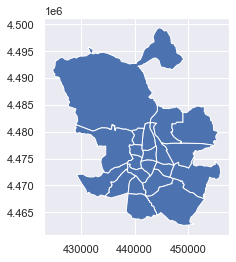

In [377]:
# Read in neighbourhood boundary files 
mad_distr = gpd.read_file('districts_mad.geojson')
# Check they plot correctly 
mad_distr.plot()

<AxesSubplot:>

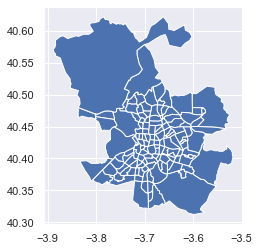

In [378]:
# Read in other boundaries created by idealista
mad_neighb = gpd.read_file('idealista_level8_mad.geojson')
# Check they plot correctly 
mad_neighb.plot()

<AxesSubplot:>

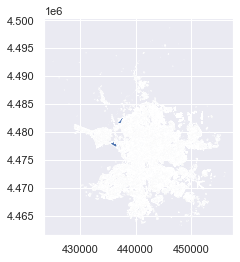

In [379]:
# Read in cadastral building footprints
mad_cadastre = gpd.read_file('polygons_inspire_building_28079_202205.geojson')
# Check they plot correctly 
mad_cadastre.plot()

### Data Manipulation 
Run these lines to create new variables that will be needed for the analysis.

In [405]:
# Create a column called count that assigns a '1' to each observation
mad_s['count']='1'
# Change data type to integer 
mad_s['count'] = mad_s['count'].astype('int')

In [406]:
# Create new variable which splits price into deciles 
mad_s2['p_decile'] = pd.qcut(mad_s['price'], 10, labels=False)

In [407]:
# Create geometry column for each df
mad_s['geometry'] = [Point(xy) for xy in zip(mad_s['long'], mad_s['lat'])]
# Coordinate reference system : WGS84

In [408]:
# Convert to geodataframe
# Define crs
crs=4326
mad_s2 = gpd.GeoDataFrame(mad_s, geometry='geometry', crs=crs)

In [409]:
# Check it worked 
mad_s2.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 94814 entries, 0 to 94813
Data columns (total 31 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   ID                94814 non-null  object  
 1   period            94814 non-null  int64   
 2   price             94814 non-null  int64   
 3   unitp             94814 non-null  float64 
 4   area              94814 non-null  int64   
 5   room              94814 non-null  int64   
 6   bath              94814 non-null  int64   
 7   terrace           94814 non-null  int64   
 8   aircon            94814 non-null  int64   
 9   parking           94814 non-null  int64   
 10  north             94814 non-null  int64   
 11  south             94814 non-null  int64   
 12  east              94814 non-null  int64   
 13  west              94814 non-null  int64   
 14  swimpool          94814 non-null  int64   
 15  garden            94814 non-null  int64   
 16  duplex        

### Section 1: Exploratory (Spatial) Data Analysis
* Setion 1A: Visualisations
* Section 1B: Geovisualisations 

In section 1A we will do the following..
* Understand the distribution of the variables in the data
* Analyze the frequency and other such characteristics of data
* Visualize the relationship that may exist between different variables

Understanding the trends and patterns of data is a key fisrt step in any analysis. As the data covers 3 different cities, we can explore how these relationships may/ may not vary based on the local context. A great resource is the python graph gallery (https://python-graph-gallery.com/), a collection of 100's of charts made with python, including reproducible code. Lets take a look.

#### 1A: Univariate statistics  
Univariate analysis is a technique to analyse one variable's range and measures of central tendency. 

In [385]:
# Create a table showing univariate statistics for each variable in the dataset
# Change the dataframe to see the statistics for the other cities
np.round(mad_s.describe().T, 2) # Change 'mad' to 'bar' or 'val' to look at different cities

,count,mean,std,min,25%,50%,75%,max
period,94814.0,201808.61,3.68,201803.00,201806.00,201809.00,201812.00,201812.00
price,94814.0,396112.27,417076.08,21000.00,160000.00,262000.00,467000.00,8133000.00
unitp,94814.0,3661.08,1700.49,805.31,2240.00,3480.00,4744.65,9997.56
area,94814.0,101.40,67.08,21.00,62.00,83.00,117.00,985.00
room,94814.0,2.58,1.24,0.00,2.00,3.00,3.00,93.00
bath,94814.0,1.59,0.84,0.00,1.00,1.00,2.00,20.00
terrace,94814.0,0.36,0.48,0.00,0.00,0.00,1.00,1.00
aircon,94814.0,0.45,0.50,0.00,0.00,0.00,1.00,1.00
parking,94814.0,0.23,0.42,0.00,0.00,0.00,0.00,1.00
north,94814.0,0.11,0.31,0.00,0.00,0.00,0.00,1.00


**Histograms and Kernel Density Estimation (KDE)**

The purpose of a histogram is to understand the distribution of numerical data.  The height of the bar represents the number of values in the data set that fall into that bin (equal class intervals of the variable's range). The following code chunk plots a histogram of a variable's frequency. For further information check out this resource (https://statisticsbyjim.com/basics/histograms/)

Change the variable to explore different numerical (contiunuous) distributions of variables, e.g price, unitp, area, conyr, dcount, maxfloor, dist_city_centre, dist_metro. 

KDE is a data smoothing operation, it estimates a probability density function of variable. Read more here: https://bit.ly/3ypJRM2. A KDE is added to the histogram the show the smoothed distribution. 
A rug plot is also shown at the bottom of the histogram, it shows the distribution of raw points (https://medium.com/dssimplified/how-to-interpret-plots-graphs-eaef109e276c).

Text(0.5, 1.0, 'Unit price distribution in Madrid (2018)')

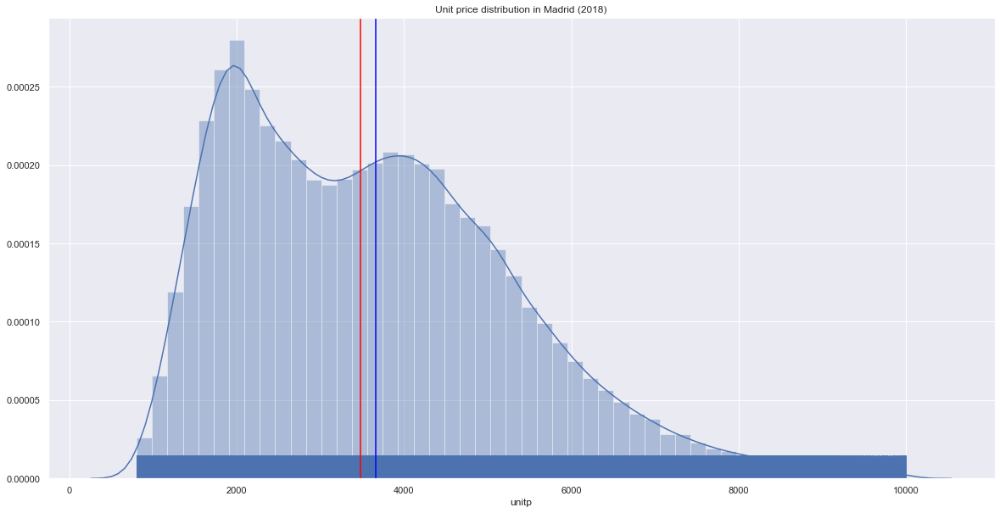

In [386]:
# Set up subplots with one row and 3 columns, set the figure size too
f, axs = plt.subplots(1, figsize=(20, 10))
sns.distplot(mad_s["unitp"],                 # Change the variable in sqaure brackets to explore other distibutions
             kde=True,                      # Sow KDE
             rug=True,                      # Show rug plot
             bins=50,                       # You can change the number of bins here   
             ax=axs)
axs.axvline(x=mad_s.unitp.median(),     # Add a line to show the median, you will need to change the variable here too 
            color='red')
axs.axvline(x=mad_s.unitp.mean(),     # Add a line to show the mean, you will need to change the variable here too 
            color='blue')

# Give each graph a title
axs.set_title("Unit price distribution in Madrid (2018)")

**Distribution of unit price**

We are particularly interested in the distribution of the price variables. Unit price is a better measure than price as it controls for the size of properties (larger houses tend to be more expensive).
* Unit price is skewed to the right
* Two peaks in the data suggest a slight bimodal distributio, indicating there are two main groups of property prices
* Interesting fluctuation in higher prices
* Evidence of some outliers

In [387]:
## Explore the data counts and types 
mad_s.info()    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 94814 entries, 0 to 94813
Data columns (total 30 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   ID                94814 non-null  object  
 1   period            94814 non-null  int64   
 2   price             94814 non-null  int64   
 3   unitp             94814 non-null  float64 
 4   area              94814 non-null  int64   
 5   room              94814 non-null  int64   
 6   bath              94814 non-null  int64   
 7   terrace           94814 non-null  int64   
 8   aircon            94814 non-null  int64   
 9   parking           94814 non-null  int64   
 10  north             94814 non-null  int64   
 11  south             94814 non-null  int64   
 12  east              94814 non-null  int64   
 13  west              94814 non-null  int64   
 14  swimpool          94814 non-null  int64   
 15  garden            94814 non-null  int64   
 16  duplex            9481

**Bar plots**

Many of the variables in the dataset are binary, which means they have 2 categories. These indicate the presence of certain structural attributes (See Table 1). We can visualise their frequency using bar charts. 
Change the x value to explore other binary/ categorical variables (terrace, duplex, parking, studio, topfloor, south/north/east/west).

Text(0.5, 1.0, 'Frequency of garden attribute')

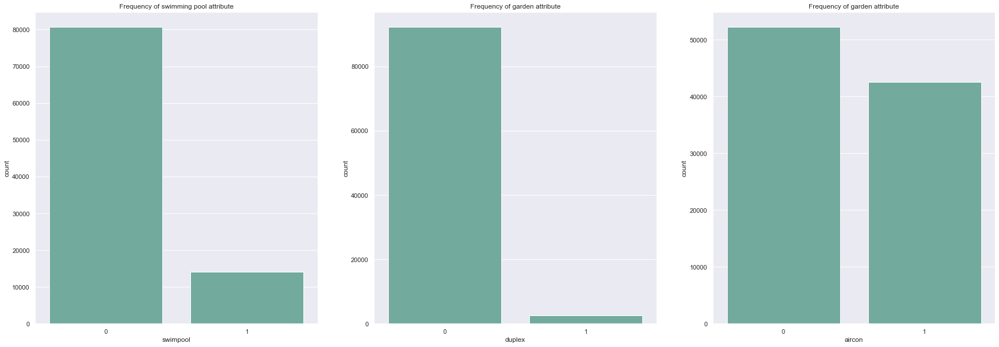

In [388]:
# Create bar plots of binary variables
# Create subplots
f, axs= plt.subplots(1, 3, figsize=(30, 10))
# Plot barplot
sns.barplot(
    x="swimpool",      # Change the variable in "" to explore other variables
    y="count", 
    data=mad_s, 
    estimator=sum, 
    ci=None, 
    color='#69b3a2',
    ax=axs[0])
# Plot barplot
sns.barplot(
    x="duplex",      # Change the variable in "" to explore other variables
    y="count", 
    data=mad_s, 
    estimator=sum, 
    ci=None, 
    color='#69b3a2',
    ax=axs[1])
# Plot barplot
sns.barplot(
    x="aircon",     # Change the variable in "" to explore other variables
    y="count", 
    data=mad_s, 
    estimator=sum, 
    ci=None, 
    color='#69b3a2',
    ax=axs[2])

# Give each graph a title
axs[0].set_title("Frequency of swimming pool attribute")
axs[1].set_title("Frequency of garden attribute")
axs[2].set_title("Frequency of garden attribute")

**Frequency of adverts across the year 2018**

The following bar chart shows the number of adverts in each quarter of the year. There are more houses avertised in the first and final couple of months of the year. The most properties (more than 40,000 are advertised between October and December).

Text(0.5, 1.0, 'Number of properties in each quarter')

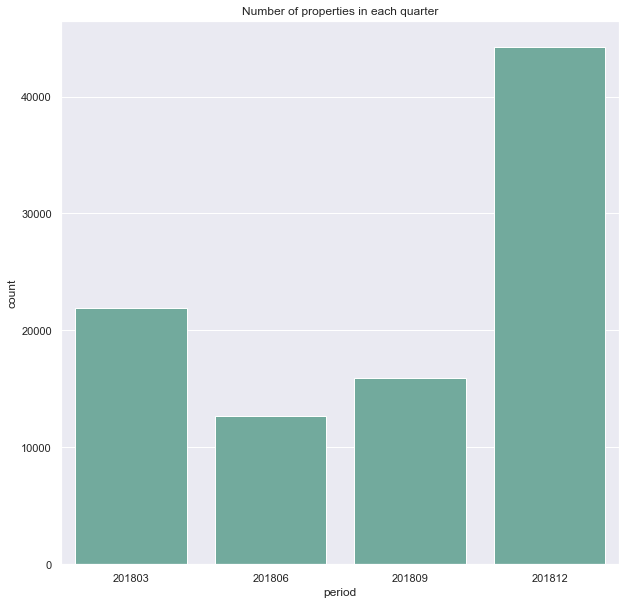

In [389]:
# plot a bar chart showing the number of adverts per period in each city 
# Set the background style of the maps 
sns.set(style="darkgrid")
# Create subplots
f, axs = plt.subplots(1, figsize=(10, 10))
sns.barplot(
    x="period", 
    y="count", 
    data=mad_s, 
    estimator=sum, 
    ci=None, 
    color='#69b3a2',
    ax=axs)

# Set title 
axs.set_title("Number of properties in each quarter")


**Frequency of houses built across years**

We can explore when the properties advertised in 2018 were built using the variable 'conyr'. This gives some indication of the development of the residential market over time. 
There are two noteable housing booms in the data (1960- 1980) and (2000- 2009). The fall houses built from 2008 is likely to be associted with the US subprime mortgate crisis 

Text(0.5, 1.0, 'Year that the advertised properties were constructed')

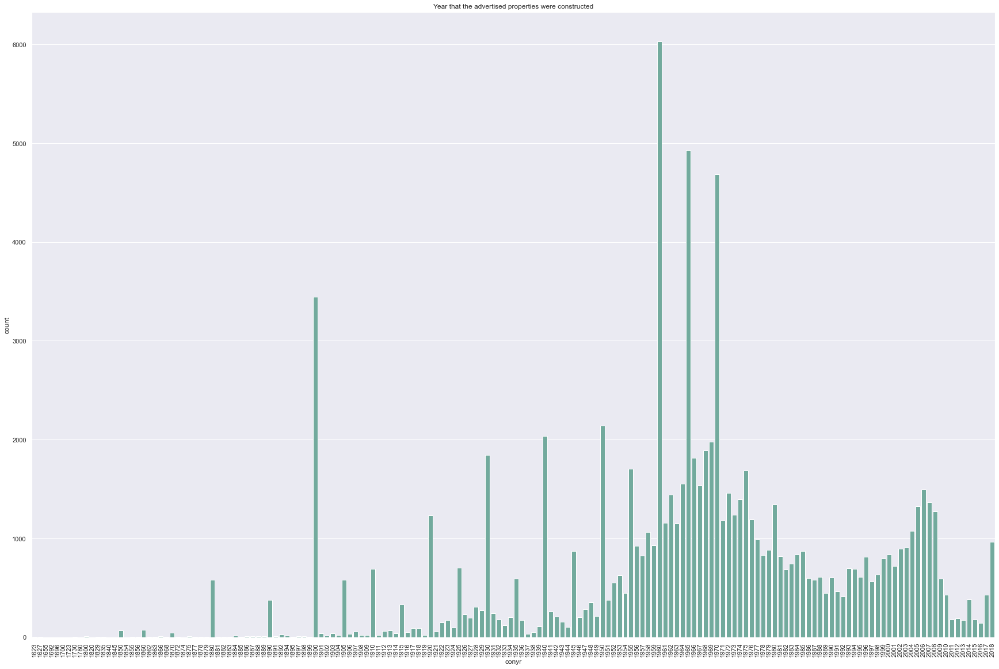

In [390]:
# Create bar plot showing the number of houses built in each year
# Create subplots
f, axs= plt.subplots(1, figsize=(30, 20))
sns.barplot(
    x="conyr", 
    y="count", 
    data=mad_s, 
    estimator=sum, 
    ci=None, 
    color='#69b3a2')
plt.xticks(rotation=90);

axs.set_title("Year that the advertised properties were constructed")


**Visualising bivariate relationships**

The following sub-section visualises the relationships exist between different variables. It is important to understand the relationship between price and the property characteristics, as this would be the outcome variable in a hedonic price model for mass appraisal.

**Scatter Plots**

Scatter plots are commonly used to visualise the relationship between two continuous variables.

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Text(0.5, 1.0, 'Relationship between price and the size of the house')

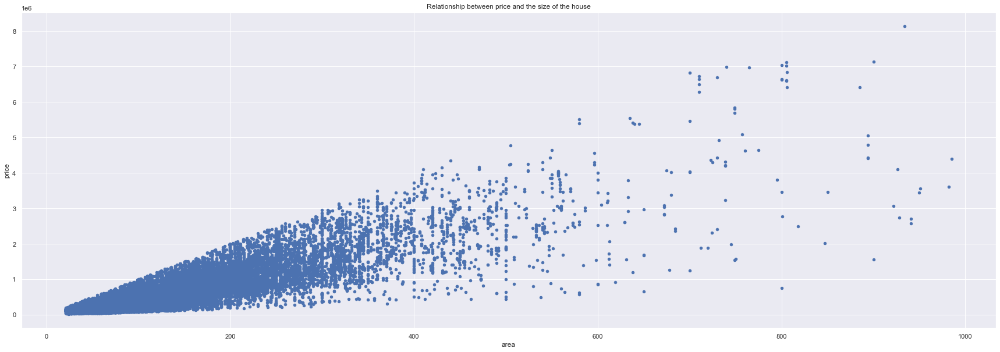

In [391]:
# Plot a scatter plot using the price and area variables for each city
f, axs= plt.subplots(1, figsize=(30, 10))
mad_s.plot.scatter(y='price', x='area', marker='o', ax=axs)
axs.set_title("Relationship between price and the size of the house")


The function pairplot helps us to visualise multiple bivariate relationships in the data with one plot (info on the function here: https://seaborn.pydata.org/generated/seaborn.pairplot.html).

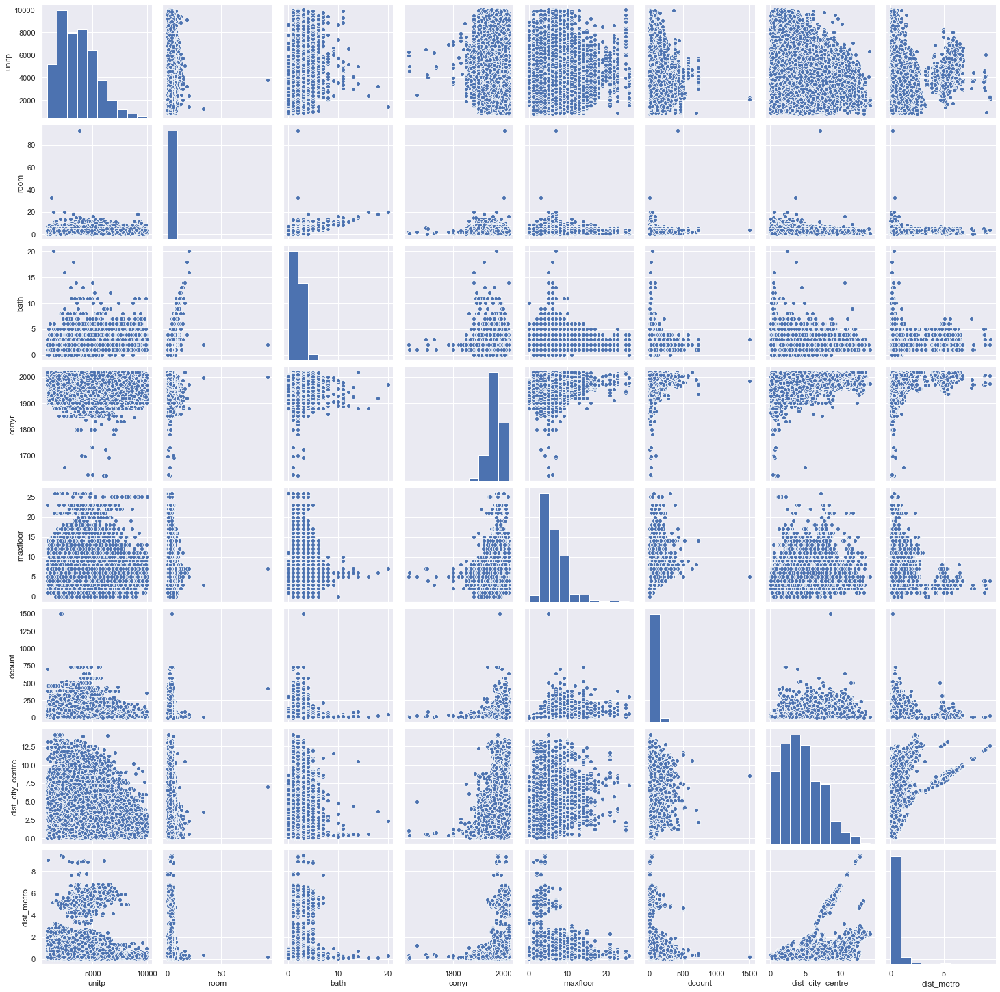

In [392]:
# Create sub set of continuous variables from Madrid data
pairplot = mad_s[['unitp', 'room', 'bath', 'conyr', 'maxfloor', 'dcount', 'dist_city_centre', 'dist_metro']]

# Plot pairplot of scatter plots using the subsection of data 
sns.pairplot(pairplot, kind="scatter")
plt.show()
 

We can see from the pairplot that relationships between the variables are non-linear.

**Strip plots**

Strip plots are a type of scatter plot which are suitable when one of the variables is categorial. 
The code chunk below shows the relationship between the quality of the housing and the construction year. 

Text(0.5, 1.0, 'A strip plot of quality accross construction year')

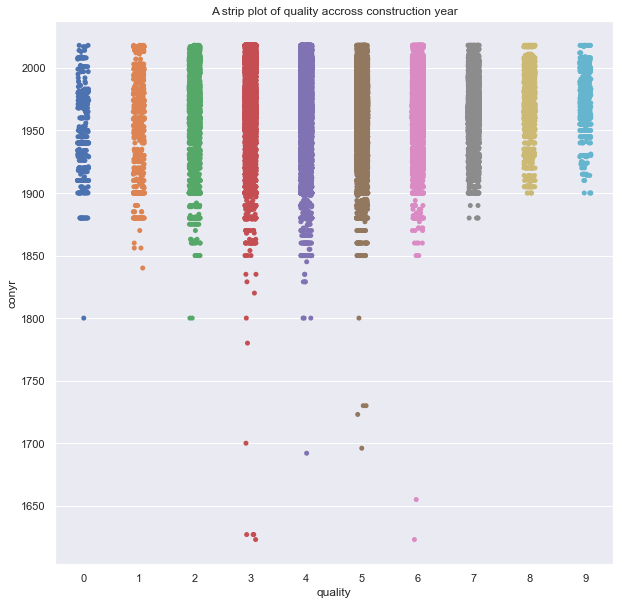

In [393]:
# Set up axis 
f, axs = plt.subplots(1, figsize=(10, 10))
# Madrid 
sns.stripplot(x=mad_s['quality'], y=mad_s['conyr'],
    ax=axs)


axs.set_title("A strip plot of quality accross construction year")

**Boxplots**

Boxplots are a well used technique for visulising the relationship between a continuous and categorical variable. If you are unsure on how to interpret boxplots check out this handy resource (https://towardsdatascience.com/understanding-boxplots-5e2df7bcbd51).

The following figure plots a boxplot for the binary housing attribute variables and unit price, using the pandas library (see documentation here https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.boxplot.html).

<AxesSubplot:title={'center':'unitp'}, xlabel='terrace'>

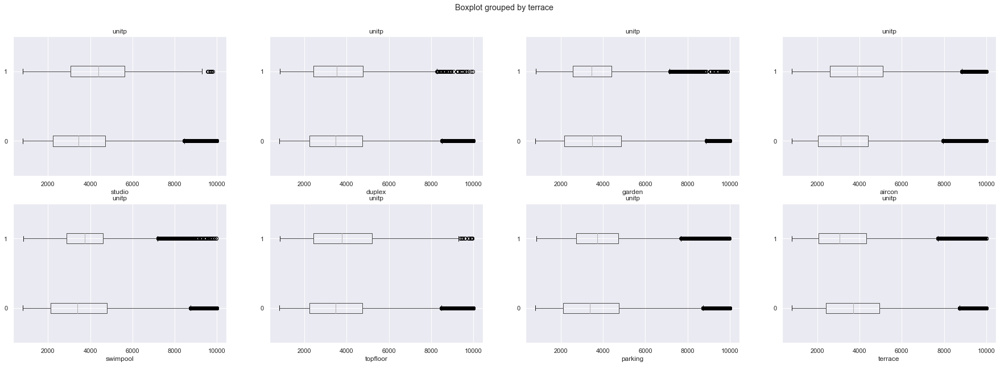

In [394]:
# Create boxplots of binary variables and outcome variable unitprice
f, axs = plt.subplots(2, 4, figsize=(30, 10))
mad_s.boxplot(column='unitp', by='studio', ax=axs[0,0], vert=False)
mad_s.boxplot(column='unitp', by='duplex', ax=axs[0,1], vert=False)
mad_s.boxplot(column='unitp', by='garden', ax=axs[0,2], vert=False)
mad_s.boxplot(column='unitp', by='aircon', ax=axs[0,3], vert=False)
mad_s.boxplot(column='unitp', by='swimpool', ax=axs[1,0], vert=False)
mad_s.boxplot(column='unitp', by='topfloor', ax=axs[1,1], vert=False)
mad_s.boxplot(column='unitp', by='parking', ax=axs[1,2], vert=False)
mad_s.boxplot(column='unitp', by='terrace', ax=axs[1,3],vert=False)

**Correlation**

A correlation is a measure of the linear relationship between two variables. The range of scores goes from -1 to 1, a score of 0 = no relationship, 1 = exactly positively correlated (as one goes up so does the other, or they go down together), -1 means there relationship is opposite (as one goes up they other goes down) and vise versa. A correlation matrix is an excellent way to visualise the correlation between all the variables in the data set. Most of the variables have a correlation score of around 0. Some of the variables (Madrid) are strongly correlated with price e.g. area and price have a positive correlation (0.77). Or price and quality (-0.52).


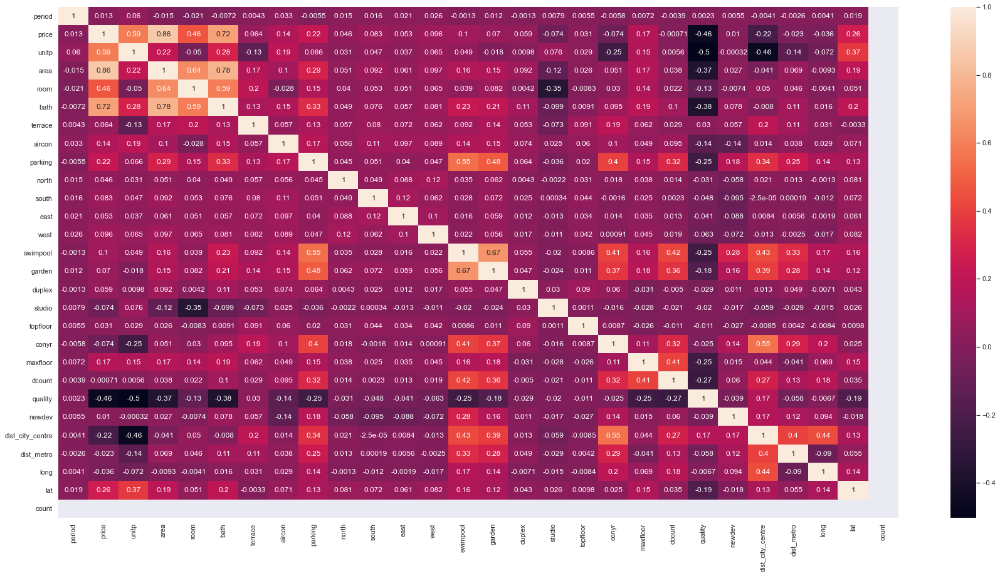

In [397]:
# Calculate correlations between all variables
corrMatrix = mad_s.corr()               # Change the 'val_s' to 'bar_s' or 'mad_s' to explore correlations in other cities 
# Specify axis size 
fig, ax = plt.subplots(figsize=(30,15))
# Use seaborn to plot correlations on a heatmap
sns.heatmap(corrMatrix, annot=True, ax=ax)
# Show figure 
plt.show()

### Section 1B: Geo-visualisations
Now we have undertaken some exploratory data analysis, we can turn our focus to the exciting bit.. understanding the distribution of variables over space.  

The following section explores visually the spatial variations in housing density and attributes: 
* Point pattern maps 
* Choropleth maps
* Building footprints 

Text(0.5, 1.0, 'Listing data points in Madrid (2018)')

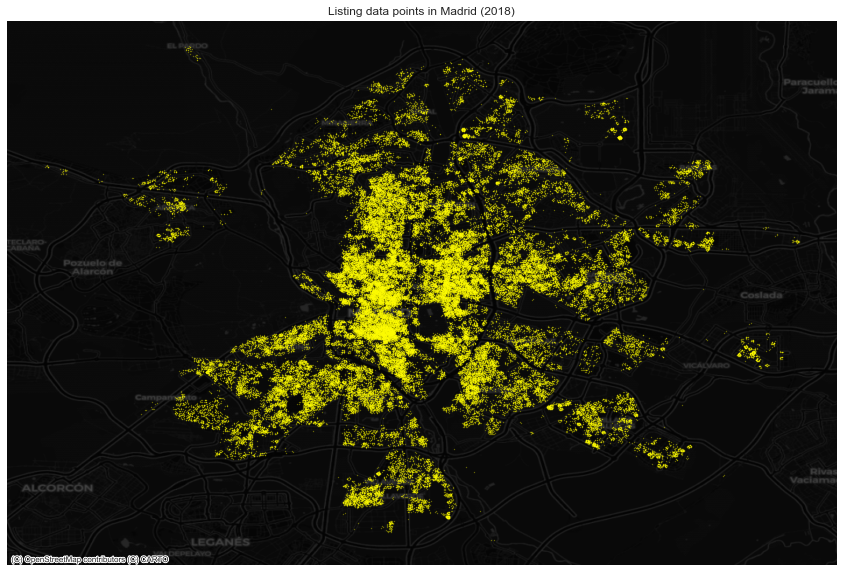

In [398]:
# Create map of raw counts across space
f, axs = plt.subplots(1, figsize=(30, 10))
# Madrid 
mad_s.plot.scatter(
    "long", 
    "lat",
    s=0.1,
    c="xkcd:bright yellow",
    alpha=0.5,
    ax=axs)
# remove axis
axs.set_axis_off()
# Add dark basemap
cx.add_basemap(
    axs, 
    crs="EPSG:4326",
    source=cx.providers.CartoDB.DarkMatter
)


axs.set_title("Listing data points in Madrid (2018)")


**Hex-Binning**

The Madrid map shows a lot of overlap in the points. When datasets have a large number of oberservations concentrated in one area it is harder to differentiate patterns. Hexagon binning is a form of bivariate histogram, which aggreagtes the data.

The underlying concept of hexagon binning =
1. the xy plane over the set (range(x), range(y)) is tessellated by a regular
grid of hexagons.
2. the number of points falling in each hexagon are counted and stored in a
data structure
3. the hexagons with count > 0 are plotted using a color ramp or varying
the radius of the hexagon in proportion to the counts.
The underlying algorithm is extremely fast and effective

(Lewin-Koh, 2021)

We will now visualise the density of adverts using hex-binning. To do so we will use the .hexbin function from the pandas library (https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.plot.hexbin.html).
 

Text(0.5, 1.0, 'Madrid')

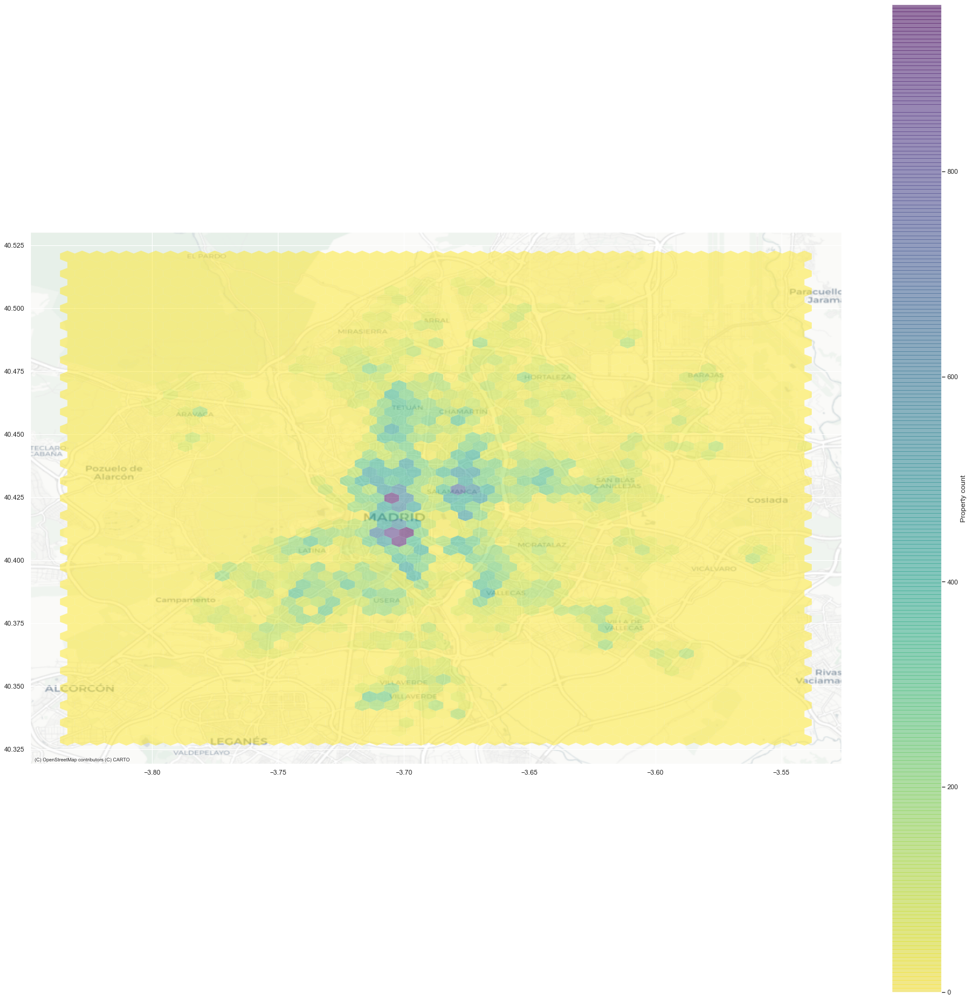

In [399]:
# Showing density with hex binning 
# Set up figure and axis
f, ax = plt.subplots(1, figsize=(30, 30))
# Generate and add hexbin with 50 hexagons in each 
# dimension, no borderlines, half transparency,
# and the reverse viridis colormap
hb = ax.hexbin(
    mad_s['long'], 
    mad_s['lat'],
    gridsize=50, 
    linewidths=0,
    alpha=0.5, 
    cmap='viridis_r'
)
# Add basemap
cx.add_basemap(
    ax, 
    crs=mad_s2.crs,
    source=cx.providers.CartoDB.Positron
)

# Add colorbar
f.colorbar(hb, ax=ax, label='Property count')
# Remove axes
#ax.set_axis_off()
axs.set_title("Madrid")


Now we have visualised the location of the adverts we can take this further and look at the spatial variation in a attribute of interest using hex bins. 
Try changing the colours using the 'cmap' option. See https://matplotlib.org/3.5.0/tutorials/colors/colormaps.html for a list of colours and information on how to choose a good colour map.

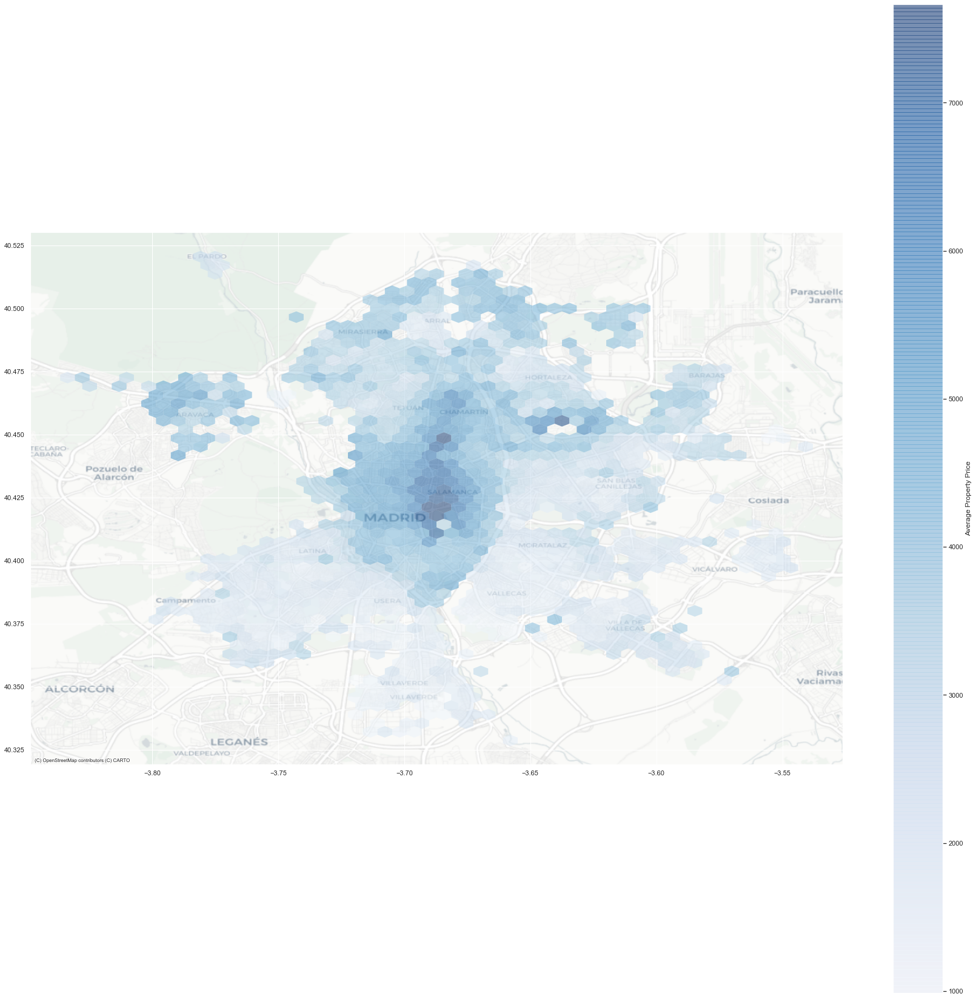

In [400]:
f, ax = plt.subplots(1, figsize=(30, 30))
hb2 = ax.hexbin(
    mad_s['long'], 
   mad_s['lat'],
        mad_s['unitp'],            # Change this line to explore other variables
    gridsize=50, 
    linewidths=0,
    alpha=0.5, 
    cmap='Blues'
)
# Add basemap
cx.add_basemap(
    ax, 
    crs=mad_s2.crs,
    source=cx.providers.CartoDB.Positron
)
# Add colour bar
f.colorbar(hb2, ax=ax, label='Average Property Price')

**Spatial KDE**

We talked about KDE breifly in the first section. We can take this technique a step further and implement it over space using seaborns .kdeplot. (https://seaborn.pydata.org/generated/seaborn.kdeplot.html).

KDE differs from hexbinning, rather then using discrete bins, they are continuous.


Text(0.5, 1.0, 'Spatial KDE of properties advertised in Madrid (2018)')

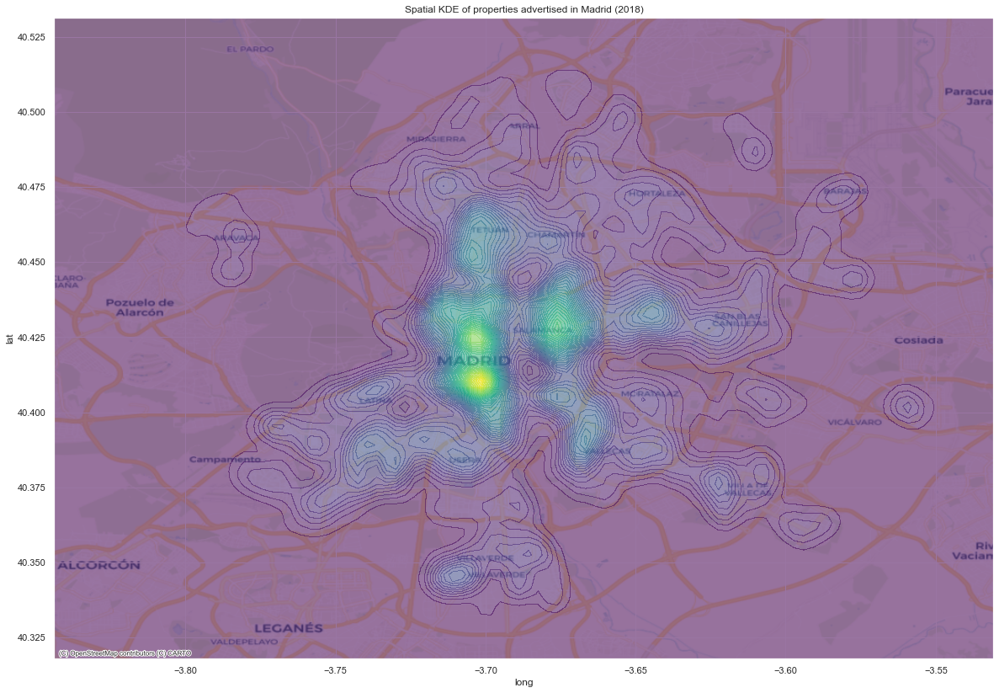

In [401]:
### KDE
# Set up figure and axis
f, axs = plt.subplots(1, figsize=(20, 20))
# Generate and add KDE with a shading of 50 gradients 
# coloured contours, 75% of transparency,
# and the reverse viridis colormap
sns.kdeplot(
    mad_s['long'], 
    mad_s['lat'],
    n_levels=50, 
    shade=True,
    alpha=0.55, 
    cmap='viridis',
    ax=axs
)
#Add basemap
# Add basemap
cx.add_basemap(
    axs, 
    crs=mad_s2.crs,
    source=cx.providers.CartoDB.Voyager
)
# Remove axes
#ax.set_axis_off()
axs.set_title("Spatial KDE of properties advertised in Madrid (2018)")

**Point Pattern Visualisations**

We can colour the points based on the value of their attributes. This doesn't require aggregation of the data, but we may encounter the problem of overplotting. Try changing the column ='p_decile' to explore different variables.

Text(0.5, 1.0, 'Price Decile')

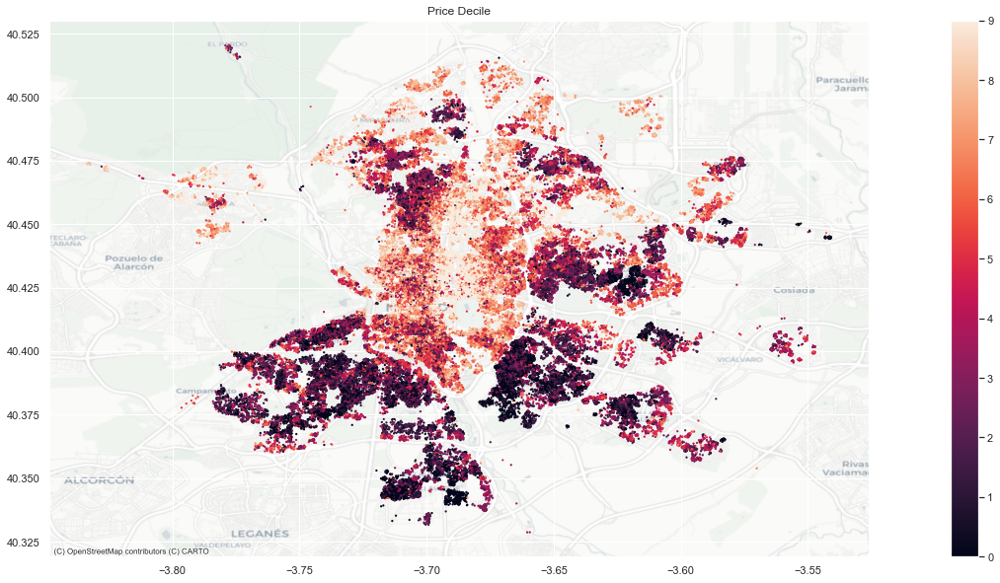

In [410]:
## Mapping the price deciles
# Setup figure and ax
f, axs = plt.subplots(1, figsize=(30, 10))
# Plot unique values choropleth including a legend and with no boundary lines
mad_s2.plot(
    column='p_decile', categorical=False, linewidth=0, ax=axs, markersize=5, legend=True   # Also try 'unitp'
)
cx.add_basemap(
    ax=axs, 
    source=cx.providers.CartoDB.Positron,
    crs=mad_s2.crs
)        
# Add title
axs.set_title("Price Decile")
# Display the map

**Sub-Setting the data**

The documentation for the .loc function can be found here (https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.loc.html)

In [411]:
## try splitting the data and plotting different houses
# e.g. those built after 2010
aft10 = mad_s2.loc[mad_s['conyr']> 2010]

Text(0.5, 1.0, 'Unit Price of properties built after 2010')

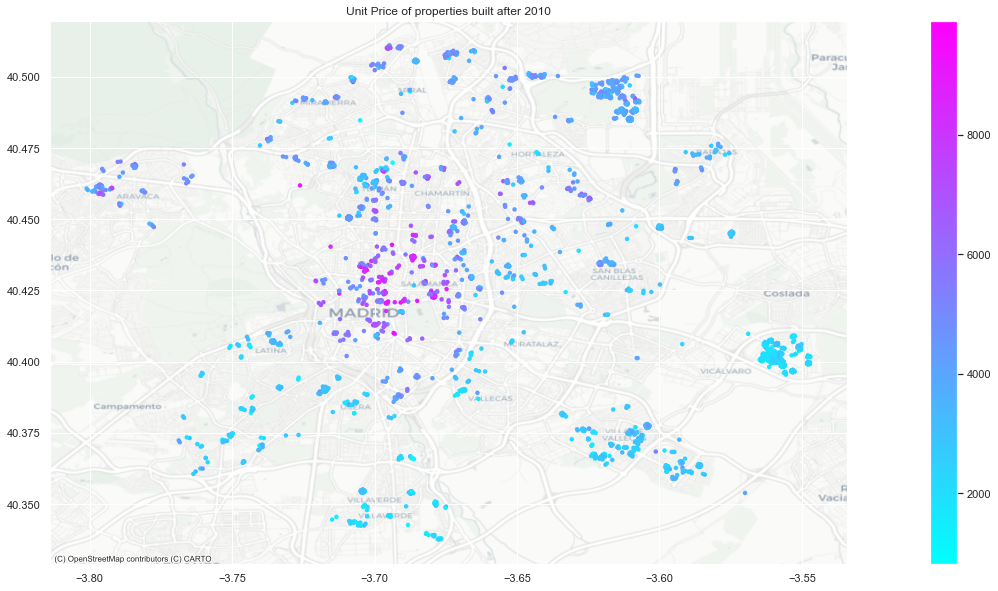

In [412]:
## Mapping the price deciles of homes built after 2010
# Setup figure and ax
f, axs = plt.subplots(1, figsize=(30, 10))
# Plot unique values choropleth including a legend and with no boundary lines
aft10.plot(
    column='unitp', categorical=False, linewidth=0, ax=axs, markersize=20, legend=True, cmap='cool'
)
cx.add_basemap(
    ax=axs, 
    source=cx.providers.CartoDB.Positron,
    crs=mad_s2.crs
)        
# Add title
axs.set_title("Unit Price of properties built after 2010")

We can see that in the 2018 advert data, some expensive properties have been built in the centre and some cheaper houses in custers on the outskirts. Generally, newly built properties in the North are more expensive. 

**EXCERSIZE**

Create new dataframes using the .loc function and map these to explore patterns of different properties.

**Choropleth Mapping**

Choropleth Maps display divided geographical areas or regions that are coloured, shaded or patterned in relation to a data variable. This provides a way to visualise values over a geographical area, which can show variation or patterns across the displayed location.

The data variable uses colour progression to represent itself in each region of the map. Typically, this can be a blending from one colour to another, a single hue progression, transparent to opaque, light to dark or an entire colour spectrum.

One downside to the use of colour is that you can't accurately read or compare values from the map. Another issue is that larger regions appear more emphasised then smaller ones, so the viewer's perception of the shaded values are affected.

**Check out the boundaries we will use**

In [413]:
## Some data manipulation 
# new crs definition
destination_crs = 'EPSG:4326'
# reprojection
mad_distr_geog = mad_distr.to_crs(destination_crs)
# show new crs
mad_distr_geog.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Text(0.5, 1.0, ' Idealista Boundaries')

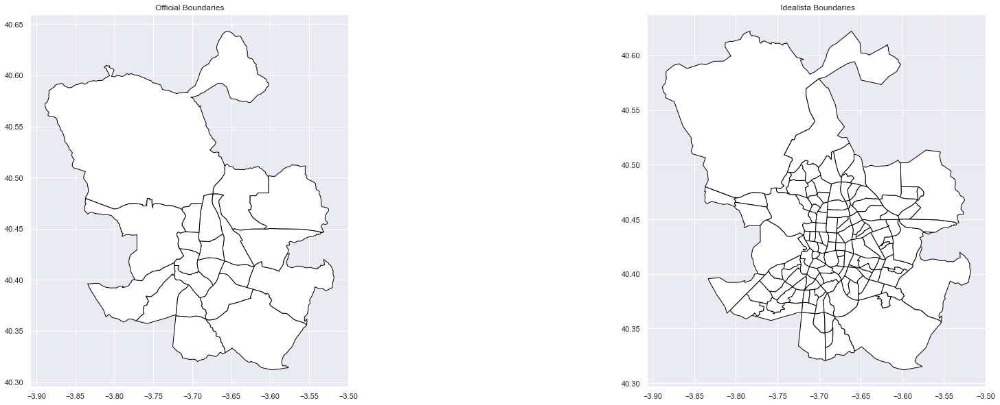

In [414]:
# Plot the 2 boundaries that we have 
# set up axis
f, axs = plt.subplots(1, 2, figsize=(30, 10))

mad_distr_geog.plot(color='white',
            edgecolor='black', 
            figsize=(10, 8),
            ax=axs[0])
mad_neighb.plot(color='white',
            edgecolor='black', 
            figsize=(10, 8),
            ax=axs[1])

# Add title
axs[0].set_title("Official Boundaries")
axs[1].set_title(" Idealista Boundaries")

**Create new data set which aggregates the points into areas**

In [415]:
# Aggregate the points into the idealista boundaries
mad_s2_geom = mad_s2.to_crs(25830)        # Create new dataframe with different crs
mad_s2_neighb = gpd.sjoin(mad_s2_geom, mad_neighb.to_crs(25830), how='right') # USe geopandas to do a spatial join 
mad_neighb_agg = mad_s2_neighb.dissolve(by='locationname', aggfunc='median')     # dissolve  
mad_neighb_agg.head()                                                          # show first 5 rows of dataframe

,geometry,index_left,period,price,unitp,area,room,bath,terrace,aircon,...,maxfloor,dcount,quality,newdev,dist_city_centre,dist_metro,long,lat,count,p_decile
locationname,,,,,,,,,,,,,,,,,,,,,
12 de Octubre-Orcasur,"POLYGON ((441252.044 4470621.664, 441373.288 4...",60973.5,201809.0,151000.0,1515.073529,100.0,3.0,2.0,1.0,0.0,...,6.0,22.0,6.0,0.0,5.253568,0.457085,-3.697970,40.369543,1,2.0
Abrantes,"POLYGON ((438965.407 4470133.832, 438906.407 4...",58566.0,201809.0,131000.0,1828.571429,77.0,3.0,1.0,0.0,0.0,...,5.0,17.0,6.0,0.0,4.579542,0.263758,-3.728961,40.380410,1,1.0
Acacias,"POLYGON ((439612.725 4473141.642, 439711.259 4...",39914.5,201809.0,340000.0,4053.045923,86.0,2.0,1.0,0.0,1.0,...,7.0,31.5,5.0,0.0,1.630977,0.341084,-3.703671,40.402190,1,6.0
Adelfas,"POLYGON ((442655.541 4472176.653, 442570.939 4...",40753.5,201809.0,380500.0,4145.161290,96.5,3.0,2.0,0.0,0.0,...,7.0,39.0,4.0,0.0,3.278441,0.260614,-3.671229,40.400727,1,6.0
Aeropuerto,"POLYGON ((450573.626 4477867.545, 449782.086 4...",66281.0,201812.0,112000.0,1900.000000,56.0,2.0,1.0,0.0,0.0,...,3.0,7.0,7.0,0.0,10.993741,0.889314,-3.582125,40.450731,1,0.0


**Plot a choropleth map of unit price**

When mapping the average price on a choropleth, we split the data to create categories. There are different ways of doing this. Check out this tutorial for different ways of doing this (http://darribas.org/gds15/content/labs/lab_04.html). In the example below we have used quantiles and equal intervals.

(423244.4493678745, 457618.05706934846, 4460854.31107106, 4498811.6186407795)

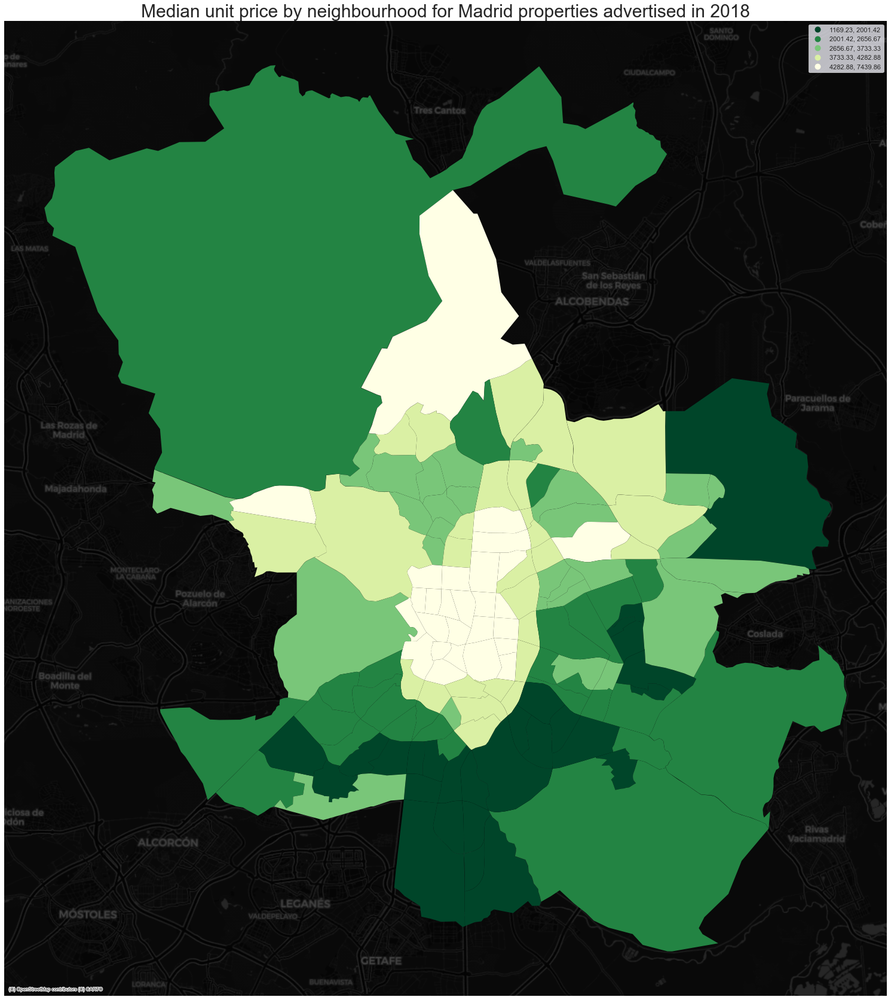

In [416]:
# plot a choropleth of mean unit price per area
f, axs = plt.subplots(1, figsize=(30, 30))

mad_neighb_agg.plot(column = 'unitp',
                    legend=True,
                   scheme='quantiles',
                   cmap='YlGn_r',
                   linewidth=0,       # Use _r to reverse the colour scheme 
                    ax =axs,
                figsize=(20, 8))
cx.add_basemap(
    ax=axs,
    source=cx.providers.CartoDB.DarkMatter,
    crs=mad_neighb_agg.crs
)  


# Add title
axs.set_title("Median unit price by neighbourhood for Madrid properties advertised in 2018", fontsize=30)
axs.axis('off')


(423244.4493678745, 457618.05706934846, 4460854.31107106, 4498811.6186407795)

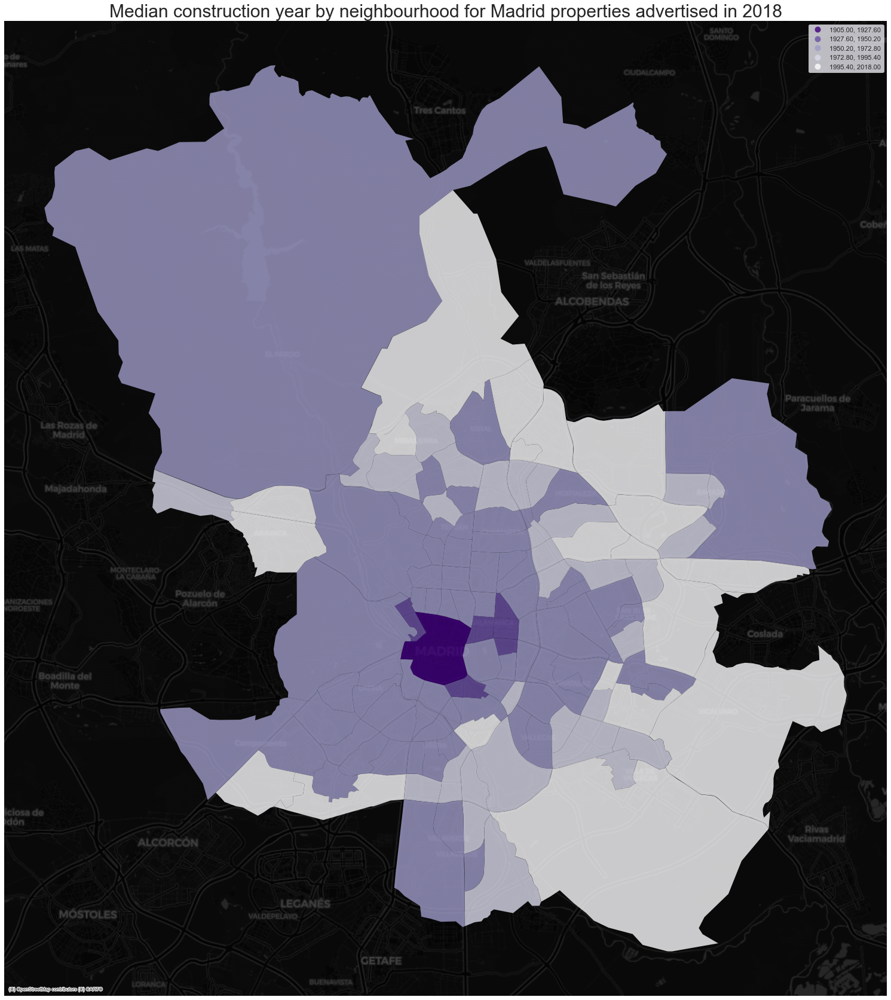

In [417]:
# plot a choropleth of construction ye
f, axs = plt.subplots(1, figsize=(30, 30))
mad_neighb_agg.plot(column = 'conyr',
                    legend=True,
                   cmap='Purples_r',
                   linewidth=0,
                    scheme='Equal_Interval',
                   ax =axs,
                  alpha=0.8)       

cx.add_basemap(
    ax=axs,
    source=cx.providers.CartoDB.DarkMatter,
    crs=mad_neighb_agg.crs
)   
axs.set_title("Median construction year by neighbourhood for Madrid properties advertised in 2018",fontsize=30)
axs.axis('off')

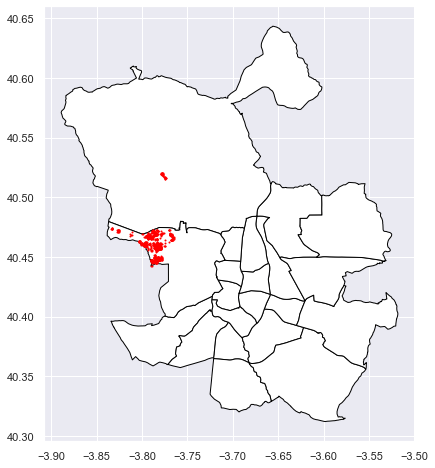

In [418]:
# Create sub-section of the data, including properties that are more than 4km from the nearest metro
mad_s3 = mad_s2[mad_s2["dist_metro"] > 4]
# Plot these properties
# base layer definition
base = mad_distr_geog.plot(color='white', 
                  edgecolor='black', 
                  figsize=(10, 8))

# we add large metro distance ads
mad_s3.plot(ax=base,
            marker='o', 
            color='red', 
            figsize=(12, 8), 
            markersize=1);

#### Building footprints

We have downloaded the building footprints from the Cadastral. The data is a geodataframe with a geometry for each building. We will now use the building footprints to visualise housing attributes. This overcomes the issue of overplotting points. 

In [419]:
# Take a look at the format of the cadastral data 
mad_cadastre.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 124181 entries, 0 to 124180
Data columns (total 25 columns):
 #   Column                                   Non-Null Count   Dtype   
---  ------                                   --------------   -----   
 0   id                                       124181 non-null  int64   
 1   gml_id                                   124181 non-null  object  
 2   beginlifespanversion                     124181 non-null  object  
 3   conditionofconstruction                  124181 non-null  object  
 4   beginning                                124181 non-null  object  
 5   end                                      124181 non-null  object  
 6   informationsystem                        124181 non-null  object  
 7   reference                                124181 non-null  object  
 8   localid                                  124181 non-null  object  
 9   namespace                                124181 non-null  object  
 10  horizontalge

In [420]:
mad_cadastre.crs

<Projected CRS: EPSG:25830>
Name: ETRS89 / UTM zone 30N
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: Europe - 6°W to 0°W and ETRS89 by country
- bounds: (-6.0, 35.26, 0.0, 80.53)
Coordinate Operation:
- name: UTM zone 30N
- method: Transverse Mercator
Datum: European Terrestrial Reference System 1989
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [421]:
# Change the crs of the neighbourhoods
mad_neighb2 = mad_neighb.to_crs(25830)

<AxesSubplot:>

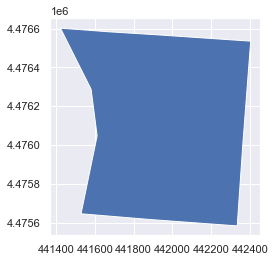

In [422]:
# Plot the Castellana neighourhood
mad_neighb_castellana = mad_neighb2.loc[mad_neighb2.locationname == 'Castellana']
mad_neighb_castellana['geometry'].plot()

Now, we explore the cadastral dataset. We can join the cadastral data to the neighbourhood polygons, to plot the building footprint of a single area.

In [423]:
# Create a centroid column in the cadastre data
mad_cadastre['centroid'] = mad_cadastre.centroid
# create new data frame and make centroid column spatial
mad_cadastre_centroid = mad_cadastre.set_geometry('centroid')
# Check it out 
mad_cadastre_centroid.head()

,id,gml_id,beginlifespanversion,conditionofconstruction,beginning,end,informationsystem,reference,localid,namespace,...,numberofdwellings,documentlink,format,sourcestatus,officialareareference,value,value_uom,endlifespanversion,geometry,centroid
0,4903460,ES.SDGC.BU.1877503VK5717H,2016-09-22T00:00:00,functional,1985-01-01T00:00:00,1985-01-01T00:00:00,https://www1.sedecatastro.gob.es/CYCBienInmueb...,1877503VK5717H,1877503VK5717H,ES.SDGC.BU,...,0,http://ovc.catastro.meh.es/OVCServWeb/OVCWcfLi...,jpeg,NotOfficial,grossFloorArea,780,m2,None,"POLYGON ((451803.765 4477607.110, 451803.917 4...",POINT (451810.815 4477598.908)
1,4870804,ES.SDGC.BU.1775508VK5717F,2006-09-04T00:00:00,functional,2002-01-01T00:00:00,2002-01-01T00:00:00,https://www1.sedecatastro.gob.es/CYCBienInmueb...,1775508VK5717F,1775508VK5717F,ES.SDGC.BU,...,0,http://ovc.catastro.meh.es/OVCServWeb/OVCWcfLi...,jpeg,NotOfficial,grossFloorArea,603,m2,None,"POLYGON ((451663.788 4477403.170, 451663.937 4...",POINT (451672.063 4477393.571)
2,4939636,ES.SDGC.BU.2073403VK5727C,2002-02-26T00:00:00,functional,1976-01-01T00:00:00,1976-01-01T00:00:00,https://www1.sedecatastro.gob.es/CYCBienInmueb...,2073403VK5727C,2073403VK5727C,ES.SDGC.BU,...,1,http://ovc.catastro.meh.es/OVCServWeb/OVCWcfLi...,jpeg,NotOfficial,grossFloorArea,144,m2,None,"POLYGON ((451919.244 4477220.184, 451919.164 4...",POINT (451914.841 4477222.069)
3,4927910,ES.SDGC.BU.1979105VK5717H,2002-02-26T00:00:00,functional,1960-01-01T00:00:00,1960-01-01T00:00:00,https://www1.sedecatastro.gob.es/CYCBienInmueb...,1979105VK5717H,1979105VK5717H,ES.SDGC.BU,...,1,http://ovc.catastro.meh.es/OVCServWeb/OVCWcfLi...,jpeg,NotOfficial,grossFloorArea,255,m2,None,"MULTIPOLYGON (((451807.378 4477685.139, 451807...",POINT (451814.946 4477709.271)
4,4902197,ES.SDGC.BU.1873825VK5717D,2016-09-22T00:00:00,functional,2006-01-01T00:00:00,2009-01-01T00:00:00,https://www1.sedecatastro.gob.es/CYCBienInmueb...,1873825VK5717D,1873825VK5717D,ES.SDGC.BU,...,1,http://ovc.catastro.meh.es/OVCServWeb/OVCWcfLi...,jpeg,NotOfficial,grossFloorArea,314,m2,None,"POLYGON ((451710.680 4477088.680, 451710.770 4...",POINT (451723.646 4477088.488)


In [424]:
# Spatial join of neighbourhood polygon to the cadastre data 
mad_cadastre_castellana = gpd.sjoin(mad_cadastre_centroid, mad_neighb_castellana)

In [425]:
# Check out the data frame
mad_cadastre_castellana.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 551 entries, 10070 to 124073
Data columns (total 29 columns):
 #   Column                                   Non-Null Count  Dtype   
---  ------                                   --------------  -----   
 0   id                                       551 non-null    int64   
 1   gml_id                                   551 non-null    object  
 2   beginlifespanversion                     551 non-null    object  
 3   conditionofconstruction                  551 non-null    object  
 4   beginning                                551 non-null    object  
 5   end                                      551 non-null    object  
 6   informationsystem                        551 non-null    object  
 7   reference                                551 non-null    object  
 8   localid                                  551 non-null    object  
 9   namespace                                551 non-null    object  
 10  horizontalgeometryestim

<AxesSubplot:>

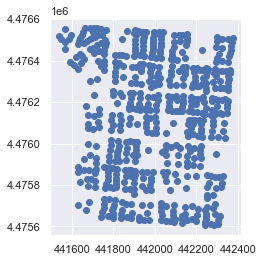

In [426]:
# Plot the centroids of each house
mad_cadastre_castellana.plot()

<AxesSubplot:>

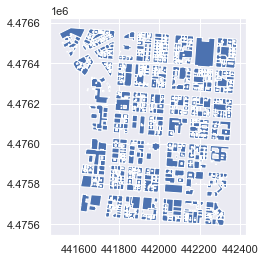

In [427]:
mad_cadastre_castellana['geometry'].plot()

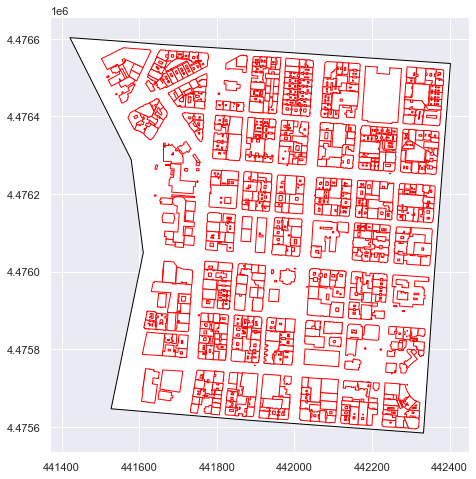

In [428]:
base = mad_neighb_castellana.plot(color='white', 
                  edgecolor='black', 
                  figsize=(10, 8))

mad_cadastre_castellana['geometry'].plot(ax=base,
                                        color='white', 
                                        edgecolor='red');

Going to try and add a map of building footprints by price here

In [429]:
# Spatial join of the footprints to housing attributes 
#mad_s2_cadastre = gpd.sjoin(mad_cadastre, mad_s2_geom, how="right")

## Section 2: Unsupervised Machine Learning (K- means clustering)

We will now move on to do some machine learning with the data. We are going to group the properties based on their attributes using an algorithmn called K-means. We will then be able to plot the categories to understand their spatial organisation.

A geodemographic analysis involves the classification of the areas that make up a greographical map into groups or categories of observations that are similar within each other but different between them. The classification is carried out using a statistical clustering algorithm that takes as input a set of attributes and returns the group (“labels” in the terminology) each observation belongs to. Depending on the particular algorithm employed, additional parameters, such as the desired number of clusters employed or more advanced tuning parameters (e.g. bandwith, radius, etc.), also need to be entered as inputs.

Although the underlying algorithm is not trivial, running K-means in Python is streamlined thanks to scikit-learn. Similar to the extensive set of available algorithms in the library, its computation is a matter of two lines of code. First, we need to specify the parameters in the KMeans method (which is part of scikit-learn’s cluster submodule). Note that, at this point, we do not even need to pass the data:

In [431]:
# Create a list of featured to go in the clustering algorithm
features = [
    'unitp', 
    'room', 
    'bath', 
    'conyr', 
    'quality',
    'garden',
    'aircon',
    'swimpool',
    'area',
    'terrace',
    'aircon',
    'parking',
    'studio',
    'topfloor',
    'maxfloor',
    'dcount'
]

In [432]:
# Create kmeans object
kmeans10 = cluster.KMeans(n_clusters=10, random_state=12345)

In [436]:
# Run the clustering algorithm for madrid
k10_mad = kmeans10.fit(mad_s2[features])
mad_s2['k10mad'] = k10_mad.labels_

In [437]:
# Find the size of each group for each city
k10sizes_m = mad_s2.groupby('k10mad').size()

Text(0.5, 1.0, 'Madrid')

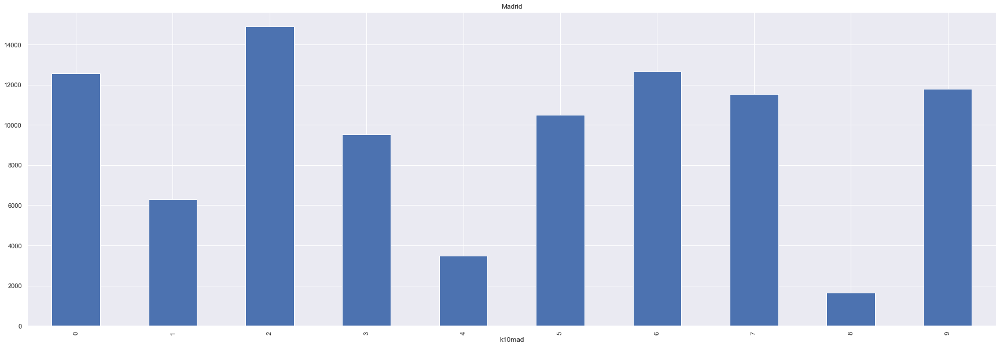

In [438]:
# Plot the range in cluster group sizes
f, axs = plt.subplots(1, figsize=(30, 10))
one = k10sizes_m.plot.bar(ax=axs)
axs.set_title("Madrid")

In [439]:
# Calculate the mean by group
k10means_m = mad_s2.groupby('k10mad')[features].median()
# Show the table transposed (so it's not too wide)
k10means_m.T

k10mad,0,1,2,3,4,5,6,7,8,9
unitp,3925.925926,6101.211149,2002.0,5262.295082,7169.528371,1457.142857,2620.689655,4565.217391,8714.285714,3284.313725
room,3.000000,2.000000,3.0,2.000000,2.000000,3.000000,3.000000,2.000000,2.000000,3.000000
bath,2.000000,2.000000,1.0,2.000000,2.000000,1.000000,1.000000,2.000000,2.000000,1.000000
conyr,1967.000000,1956.000000,1969.0,1959.000000,1954.000000,1969.000000,1970.000000,1964.000000,1956.000000,1970.000000
quality,4.000000,4.000000,6.0,4.000000,4.000000,6.000000,5.000000,4.000000,3.000000,5.000000
garden,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
aircon,0.000000,1.000000,0.0,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000
swimpool,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
area,98.000000,83.000000,75.0,88.000000,95.000000,77.000000,79.000000,95.000000,136.000000,90.000000
terrace,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


**Map the clusters**

We will start by mapping the clusters without any boundaries..

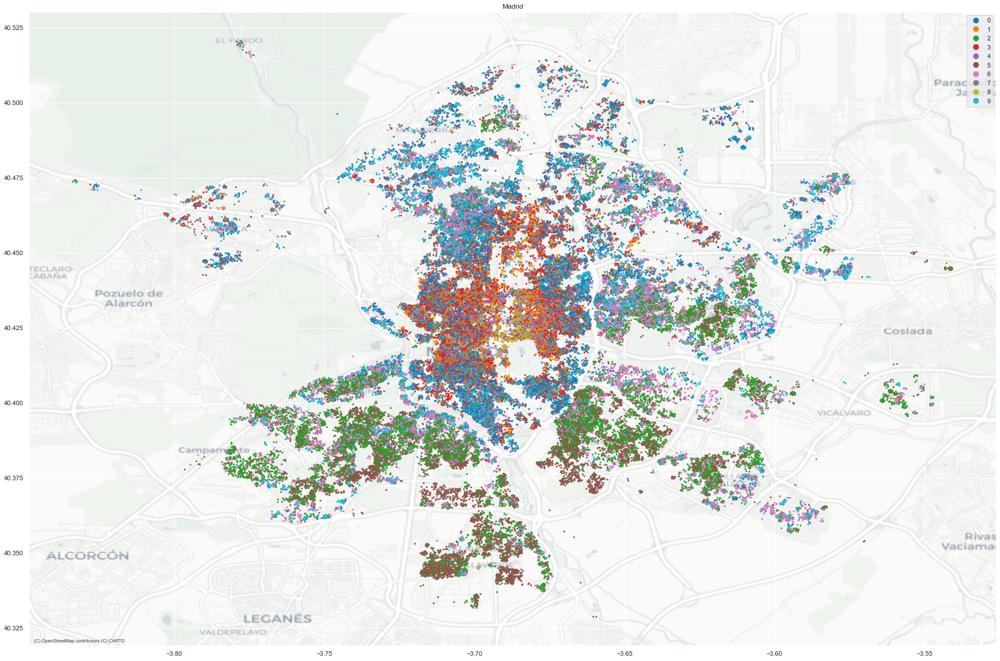

In [440]:
## Mapping the categories
# Setup figure and ax
f, axs = plt.subplots(1, figsize=(30, 30))
# Plot unique values choropleth including a legend and with no boundary lines
mad_s2.plot(
    column='k10mad', categorical=True, legend=True, linewidth=0, ax=axs, markersize=10
)
cx.add_basemap(
    ax=axs, 
    source=cx.providers.CartoDB.Positron,
    crs=mad_s2.crs
) 


axs.set_title("Madrid")
# Display the map
plt.show()

**Let's add in some boundaries**

<AxesSubplot:>

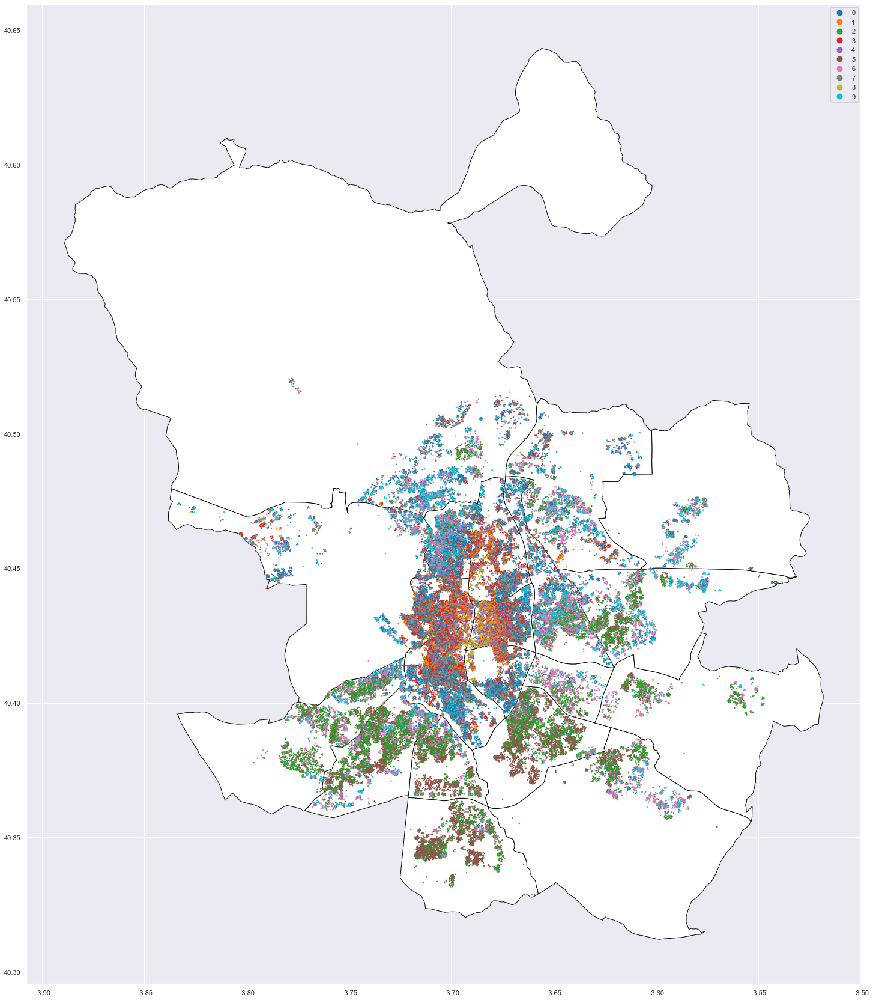

In [441]:
# Plot unique values choropleth for Madrid including a legend and with district boundary lines
base = mad_distr_geog.plot(color='white', 
                  edgecolor='black', 
                  figsize=(30, 30))

mad_s2.plot(ax=base,
            column='k10mad', categorical=True, legend=True, linewidth=0, markersize=6)

<AxesSubplot:>

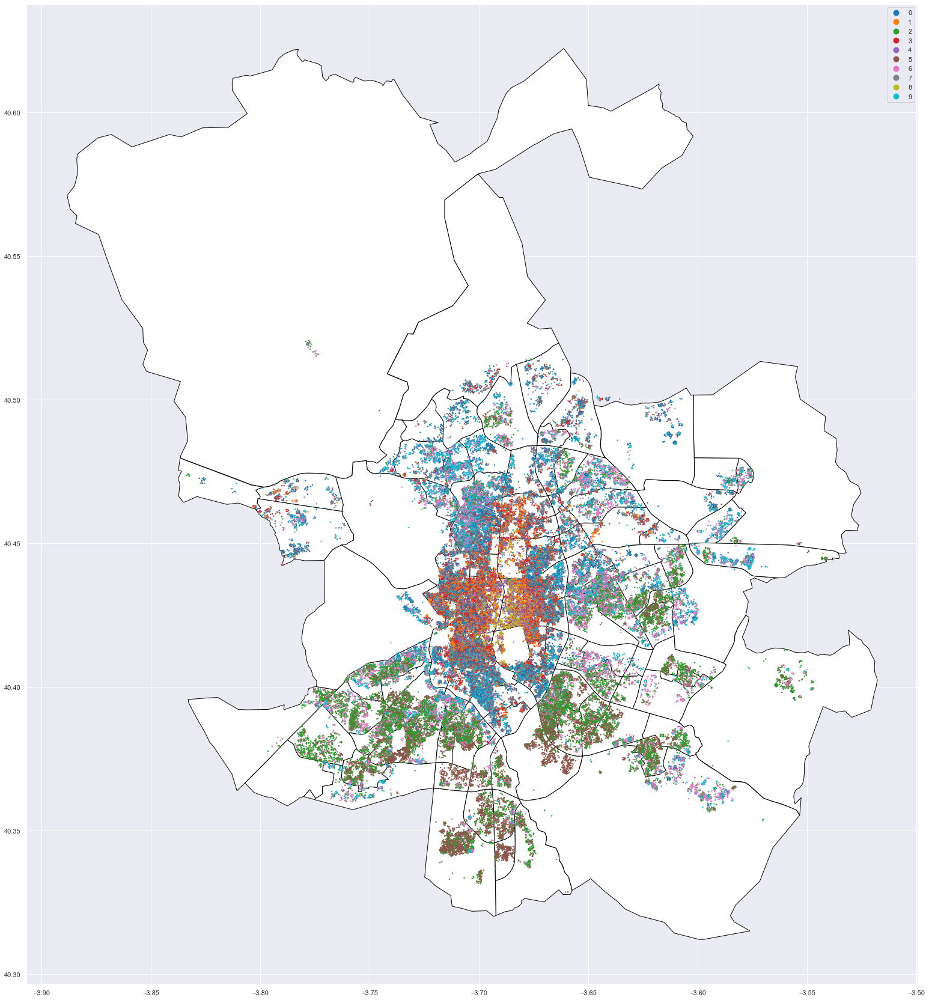

In [442]:
# Plot unique values choropleth for Madrid including a legend and with district boundary lines
base_n = mad_neighb.plot(color='white', 
                  edgecolor='black', 
                  figsize=(30, 30))

mad_s2.plot(ax=base_n,
            column='k10mad', categorical=True, legend=True, linewidth=0, markersize=6)

**Finally we can map the clusters with the building footprints**


This gives a good indication of where we are missing data

In [443]:
mad_cadastre_geog = mad_cadastre.to_crs(4326)

<AxesSubplot:>

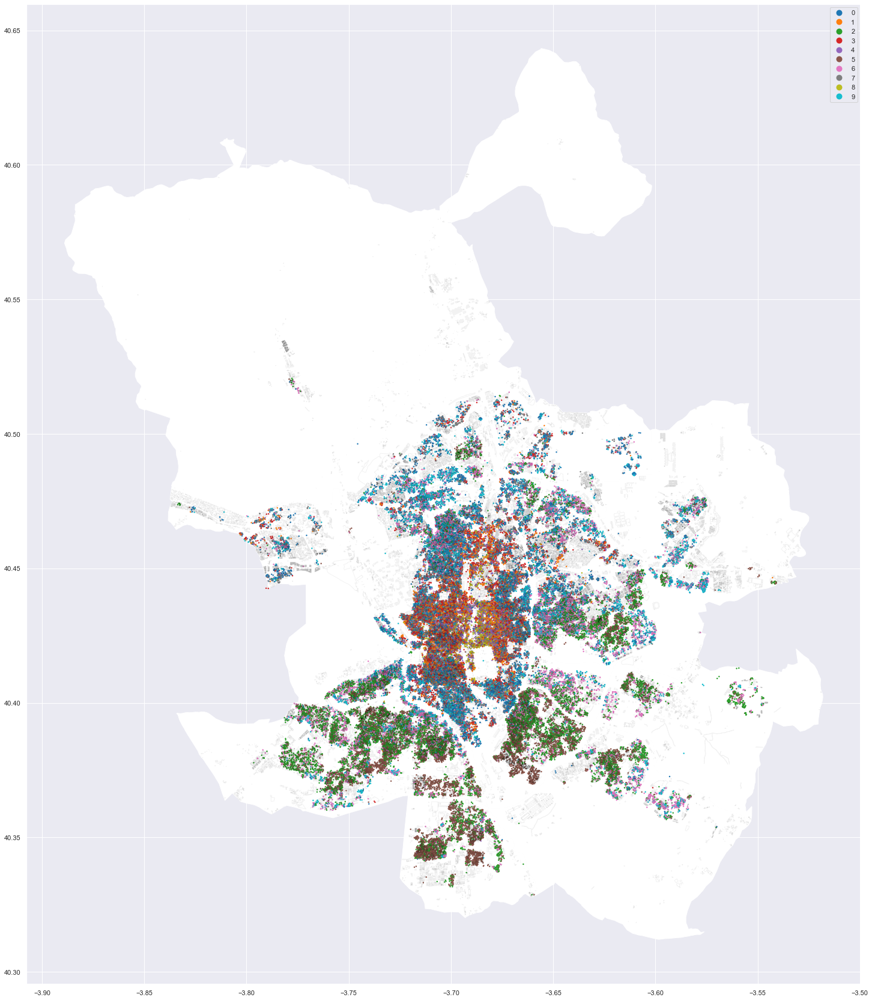

In [444]:
base = mad_distr_geog.plot(color='white', 
                  edgecolor='white', 
                  figsize=(30, 30))

mad_s2.plot(ax=base,
            column='k10mad', categorical=True, legend=True, linewidth=0, markersize=6)

mad_cadastre_geog.plot(ax=base,
                       color='white', edgecolor='black', alpha=0.05)

## Section 2B: OPTIONAL EXERCISE
Complete the cluster analysis for the other 2 cities. Find the data in the github repository 